In [ ]:
!pip install fastbook
!pip install google-search-results

In [21]:
import os
import fastai
from fastbook import *
from fastai.vision.widgets import *

import warnings
warnings.filterwarnings("ignore")

In [5]:
from serpapi import GoogleSearch
key = '1f66b4ebb53e1ed5b2e49da7623e399a2244c065801c677d2cbd28a534a882b1'

breeds = 'beagle','boxer','havanese', 'chihuahua'
path = Path('dogs')

In [7]:
# Dont Run

path.mkdir()
for o in breeds:
    dest = (path/o)
    dest.mkdir()
    params = {
        "q": f"{o} dog",
        "tbm": "isch",
        "ijn": "0",
        "api_key": key
    }
    search = GoogleSearch(params)
    results = search.get_dict()
    images_results = results['images_results']
    list= []
    for i in range(100):
       list.append(str(images_results[i]['original']))
    download_images(dest, urls=list)
        

https://serpapi.com/search
https://serpapi.com/search
https://serpapi.com/search
https://serpapi.com/search


In [8]:
fns = get_image_files(path)
fns

(#369) [Path('dogs/chihuahua/00000055.jpg'),Path('dogs/chihuahua/00000000.jpg'),Path('dogs/chihuahua/00000057.jpg'),Path('dogs/chihuahua/00000034.jpg'),Path('dogs/chihuahua/00000013.jpg'),Path('dogs/chihuahua/00000008.jpg'),Path('dogs/chihuahua/00000007.jpg'),Path('dogs/chihuahua/00000010.jpg'),Path('dogs/chihuahua/00000061.jpg'),Path('dogs/chihuahua/00000094.jpg')...]

In [9]:
failed = verify_images(fns)
failed

(#0) []

In [39]:
# DataBlock is a template for creating a dataloader
dogs = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [40]:
dls = dogs.dataloaders(path)

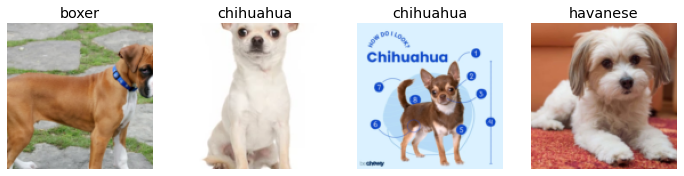

In [41]:
dls.valid.show_batch(max_n=4, nrows=1)

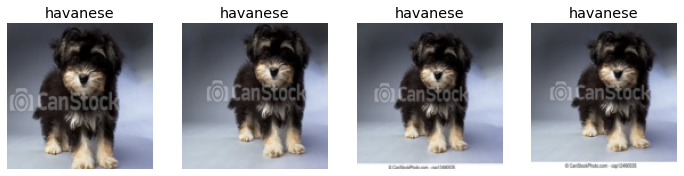

In [42]:
dogs = dogs.new(item_tfms=RandomResizedCrop(128, min_scale=0.5))
dls = dogs.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

In [43]:
dogs = dogs.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = dogs.dataloaders(path)

In [44]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.901984,0.487028,0.150685,00:11


epoch,train_loss,valid_loss,error_rate,time
0,0.396655,0.218815,0.095890,00:11
1,0.273762,0.129572,0.082192,00:11
2,0.219778,0.141192,0.054795,00:11
3,0.175936,0.135169,0.041096,00:11


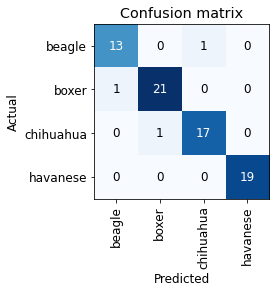

In [45]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

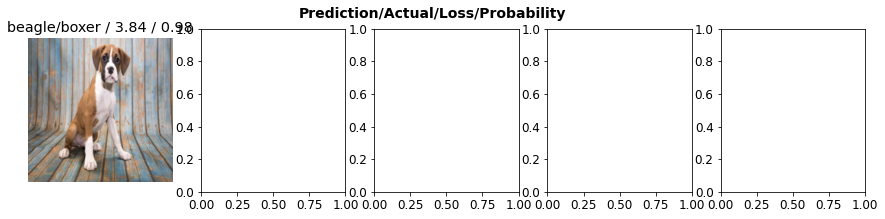

In [46]:
interp.plot_top_losses(5, nrows=1)

In [37]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [48]:
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [49]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [54]:
img = PILImage.create(btn_upload.data[0])
pred,pred_idx,probs = learn.predict(img)

In [55]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: chihuahua; Probability: 1.0000')